# 21 - 類似画像検索の評価

## 概要
CLIP-L (openai/clip-vit-large-patch14) を使った類似画像検索が「どのように成り立つのか」を理解する。

## 評価の観点
1. **同じカテゴリの画像が返ってくるか？** → Precision@K, Recall@K
2. **ランキングは適切か？** → MRR, MAP, nDCG
3. **類似性とは視覚的に何を意味するか？** → 成功・失敗ケースの可視化

## 評価手法
- **Leave-One-Out**: 各画像をクエリとして使用し、残りから類似画像を検索
- **正解の定義**: 同じカテゴリの画像 = 正解（Relevant）

In [1]:
import json
from pathlib import Path

import duckdb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image

from image_vector_poc.evaluation import (
    SimilaritySearchMetrics,
    evaluate_similarity_search,
)

## 1. データの読み込み

In [2]:
DB_PATH = Path("../data/images.duckdb")
OUTPUT_DIR = Path("../data/evaluations")
MODEL_NAME = "openai/clip-vit-large-patch14"

# 画像カタログの読み込み
conn = duckdb.connect(str(DB_PATH), read_only=True)

catalog_query = """
    SELECT id, file_path, category, file_name
    FROM image_catalog
    ORDER BY id
"""
catalog_df = conn.execute(catalog_query).fetchdf()

print(f"Total images: {len(catalog_df)}")
print(f"\nCategories:")
category_counts = catalog_df['category'].value_counts().to_dict()
for cat, count in category_counts.items():
    print(f"  {cat}: {count}")

Total images: 378

Categories:
  EuroPython2025: 129
  PyConJP2025: 77
  PyConJP2025-PreCampHiroshima: 57
  KashiwaVillagePark2026: 56
  TokyoNight202505: 49
  terada: 10


In [3]:
# 利用可能な埋め込みを確認
available_models = conn.execute("SELECT DISTINCT model_name FROM image_embeddings").fetchall()
print("Available models in DB:")
for m in available_models:
    print(f"  - {m[0]}")

# CLIP-Lの埋め込みを読み込み（カタログのIDと結合）
embeddings_query = """
    SELECT c.id, e.embedding
    FROM image_catalog c
    JOIN image_embeddings e ON c.id = e.id
    WHERE e.model_name = ?
    ORDER BY c.id
"""
embeddings_df = conn.execute(embeddings_query, [MODEL_NAME]).fetchdf()
conn.close()

if len(embeddings_df) == 0:
    print(f"\n⚠️ {MODEL_NAME} の埋め込みがDBにありません。")
    print("先にノートブック02または直接CLIPEmbedderでembeddingsを生成してください。")
    raise ValueError(f"No embeddings found for {MODEL_NAME}")
elif len(embeddings_df) < len(catalog_df):
    print(f"\n⚠️ 埋め込み数({len(embeddings_df)})がカタログ数({len(catalog_df)})より少ないです。")
    # 共通のIDのみ使用
    common_ids = set(embeddings_df['id'].tolist())
    catalog_df = catalog_df[catalog_df['id'].isin(common_ids)].reset_index(drop=True)
    print(f"共通の画像数: {len(catalog_df)}")

embeddings = np.array(embeddings_df['embedding'].tolist(), dtype=np.float32)
print(f"\n✓ Loaded {len(embeddings)} embeddings from DB")
print(f"Embeddings shape: {embeddings.shape}")

# 埋め込みベクトルのノルムを確認
norms = np.linalg.norm(embeddings, axis=1)
print(f"Embedding norms - Mean: {norms.mean():.4f}, Min: {norms.min():.4f}, Max: {norms.max():.4f}")

# カテゴリリストを取得
categories = catalog_df['category'].tolist()
category_counts = catalog_df['category'].value_counts().to_dict()
category_names = list(category_counts.keys())

Available models in DB:
  - google/siglip-base-patch16-224
  - openai/clip-vit-large-patch14

✓ Loaded 378 embeddings from DB
Embeddings shape: (378, 768)
Embedding norms - Mean: 1.0000, Min: 1.0000, Max: 1.0000


## 2. 評価の実行

In [4]:
print("Running similarity search evaluation...")
print("Method: Leave-One-Out")
print("Relevance: Same category = Relevant\n")

metrics = evaluate_similarity_search(
    embeddings=embeddings,
    categories=categories,
    category_names=category_names,
    category_counts=category_counts,
    model_name=MODEL_NAME,
    k_values=[1, 3, 5, 10, 20],
)

print("Evaluation complete!")

Running similarity search evaluation...
Method: Leave-One-Out
Relevance: Same category = Relevant

Evaluation complete!


## 3. 結果サマリー

In [5]:
print("=" * 60)
print("Similarity Search Evaluation Results")
print("=" * 60)
print(f"Model: {metrics.model_name}")
print(f"Total queries: {metrics.total_queries}")

print("\n--- Precision@K ---")
print(f"P@1:  {metrics.precision_at_1:.4f}")
print(f"P@3:  {metrics.precision_at_3:.4f}")
print(f"P@5:  {metrics.precision_at_5:.4f}")
print(f"P@10: {metrics.precision_at_10:.4f}")
print(f"P@20: {metrics.precision_at_20:.4f}")

print("\n--- Recall@K ---")
print(f"R@1:  {metrics.recall_at_1:.4f}")
print(f"R@5:  {metrics.recall_at_5:.4f}")
print(f"R@10: {metrics.recall_at_10:.4f}")
print(f"R@20: {metrics.recall_at_20:.4f}")

print("\n--- Ranking Metrics ---")
print(f"MRR (Mean Reciprocal Rank): {metrics.mrr:.4f}")
print(f"MAP (Mean Average Precision): {metrics.map_score:.4f}")
print(f"nDCG@5:  {metrics.ndcg_at_5:.4f}")
print(f"nDCG@10: {metrics.ndcg_at_10:.4f}")

print("\n--- Hit Rate@K ---")
print(f"HR@1:  {metrics.hit_rate_at_1:.4f}")
print(f"HR@5:  {metrics.hit_rate_at_5:.4f}")
print(f"HR@10: {metrics.hit_rate_at_10:.4f}")

Similarity Search Evaluation Results
Model: openai/clip-vit-large-patch14
Total queries: 378

--- Precision@K ---
P@1:  0.9444
P@3:  0.8995
P@5:  0.8788
P@10: 0.8405
P@20: 0.7971

--- Recall@K ---
R@1:  0.9444
R@5:  0.8788
R@10: 0.8430
R@20: 0.8115

--- Ranking Metrics ---
MRR (Mean Reciprocal Rank): 0.9631
MAP (Mean Average Precision): 0.8903
nDCG@5:  0.8923
nDCG@10: 0.8625

--- Hit Rate@K ---
HR@1:  0.9444
HR@5:  0.9894
HR@10: 1.0000


In [6]:
# 結果をデータフレームで表示
summary_data = {
    "Metric": [
        "Precision@1", "Precision@3", "Precision@5", "Precision@10", "Precision@20",
        "Recall@1", "Recall@5", "Recall@10", "Recall@20",
        "MRR", "MAP", "nDCG@5", "nDCG@10",
        "HitRate@1", "HitRate@5", "HitRate@10",
    ],
    "Value": [
        metrics.precision_at_1, metrics.precision_at_3, metrics.precision_at_5,
        metrics.precision_at_10, metrics.precision_at_20,
        metrics.recall_at_1, metrics.recall_at_5, metrics.recall_at_10, metrics.recall_at_20,
        metrics.mrr, metrics.map_score, metrics.ndcg_at_5, metrics.ndcg_at_10,
        metrics.hit_rate_at_1, metrics.hit_rate_at_5, metrics.hit_rate_at_10,
    ],
}
summary_df = pd.DataFrame(summary_data)
summary_df["Value"] = summary_df["Value"].apply(lambda x: f"{x:.4f}")
display(summary_df)

,Metric,Value
0,Precision@1,0.9444
1,Precision@3,0.8995
2,Precision@5,0.8788
3,Precision@10,0.8405
4,Precision@20,0.7971
5,Recall@1,0.9444
6,Recall@5,0.8788
7,Recall@10,0.8430
8,Recall@20,0.8115
9,MRR,0.9631


## 4. カテゴリ別メトリクス

In [7]:
# カテゴリ別のPrecision@Kを表示
category_df = pd.DataFrame(metrics.category_metrics).T
category_df = category_df.round(4)
category_df = category_df.sort_values("count", ascending=False)
print("Per-Category Precision@K:")
display(category_df)

Per-Category Precision@K:


,precision_at_1,precision_at_3,precision_at_5,precision_at_10,precision_at_20,count
EuroPython2025,0.9457,0.9276,0.9147,0.8721,0.8151,129.0
PyConJP2025,0.9091,0.8398,0.8104,0.7987,0.7818,77.0
PyConJP2025-PreCampHiroshima,0.8947,0.7544,0.7474,0.6561,0.6167,57.0
KashiwaVillagePark2026,0.9821,0.9762,0.9643,0.9643,0.9598,56.0
TokyoNight202505,1.0000,0.9796,0.9265,0.8918,0.8694,49.0
terada,1.0000,1.0000,0.9800,0.8600,0.4450,10.0


## 5. 可視化

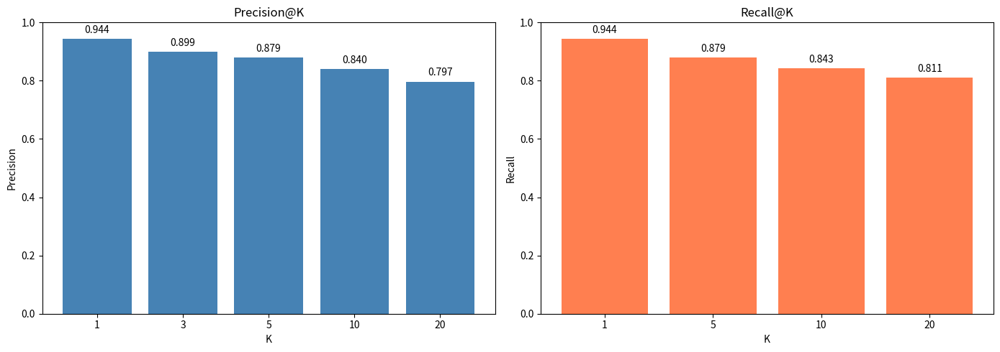

Saved: data/similarity_search_precision_recall.png


In [8]:
# Precision@K と Recall@K のバーチャート
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Precision@K
k_values = [1, 3, 5, 10, 20]
precision_values = [
    metrics.precision_at_1, metrics.precision_at_3, metrics.precision_at_5,
    metrics.precision_at_10, metrics.precision_at_20
]
axes[0].bar([str(k) for k in k_values], precision_values, color="steelblue")
axes[0].set_xlabel("K")
axes[0].set_ylabel("Precision")
axes[0].set_title("Precision@K")
axes[0].set_ylim(0, 1)
for i, v in enumerate(precision_values):
    axes[0].text(i, v + 0.02, f"{v:.3f}", ha="center")

# Recall@K
recall_k_values = [1, 5, 10, 20]
recall_values = [
    metrics.recall_at_1, metrics.recall_at_5,
    metrics.recall_at_10, metrics.recall_at_20
]
axes[1].bar([str(k) for k in recall_k_values], recall_values, color="coral")
axes[1].set_xlabel("K")
axes[1].set_ylabel("Recall")
axes[1].set_title("Recall@K")
axes[1].set_ylim(0, 1)
for i, v in enumerate(recall_values):
    axes[1].text(i, v + 0.02, f"{v:.3f}", ha="center")

plt.tight_layout()
plt.savefig("../data/similarity_search_precision_recall.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: data/similarity_search_precision_recall.png")

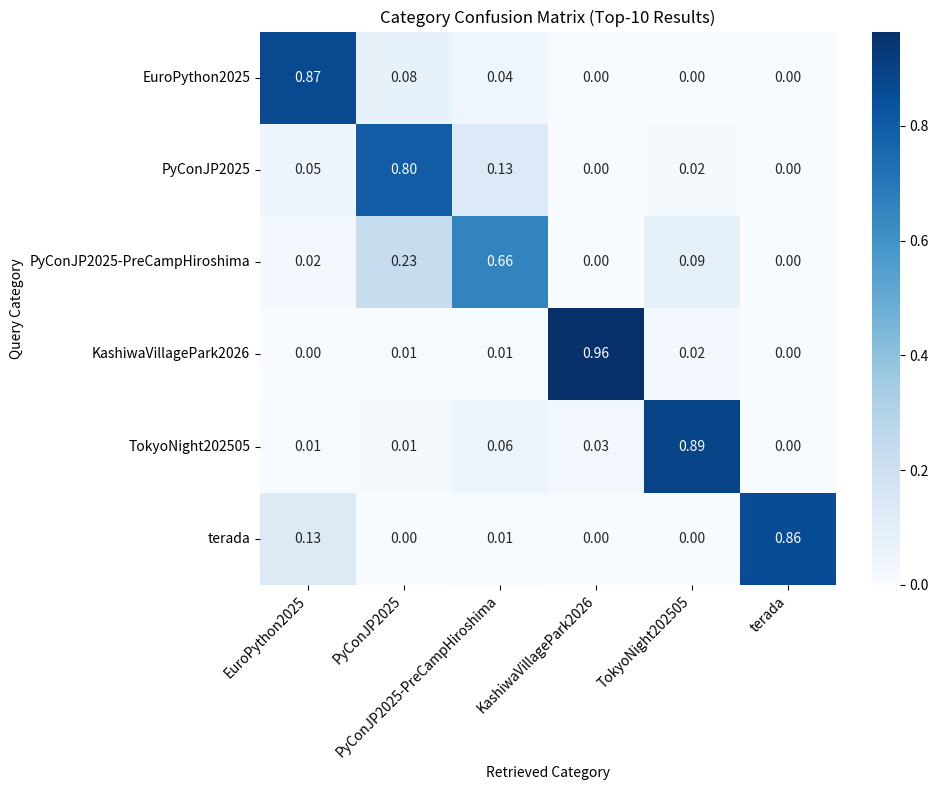

Saved: data/similarity_search_confusion_matrix.png


In [9]:
# 混同行列（ヒートマップ）
confusion_matrix = np.array(metrics.confusion_matrix)

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    confusion_matrix,
    xticklabels=category_names,
    yticklabels=category_names,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    ax=ax,
)
ax.set_xlabel("Retrieved Category")
ax.set_ylabel("Query Category")
ax.set_title("Category Confusion Matrix (Top-10 Results)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

plt.tight_layout()
plt.savefig("../data/similarity_search_confusion_matrix.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: data/similarity_search_confusion_matrix.png")

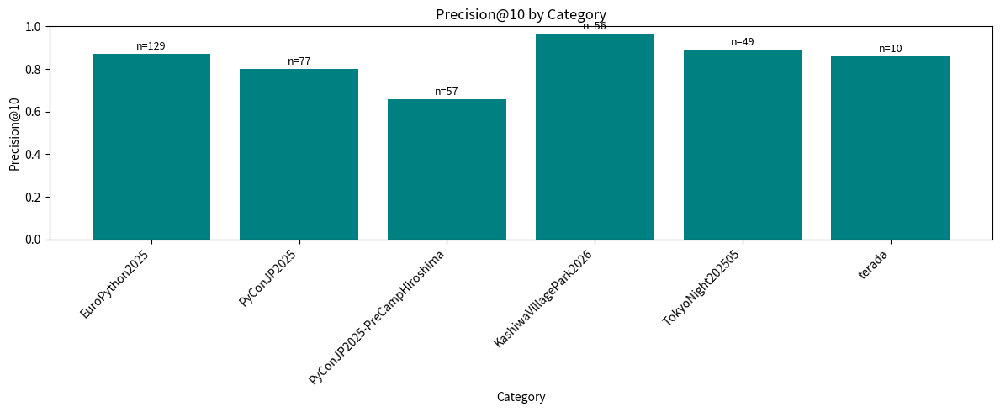

Saved: data/similarity_search_category_precision.png


In [10]:
# カテゴリ別Precision@10のバーチャート
fig, ax = plt.subplots(figsize=(12, 5))

cat_names = list(metrics.category_metrics.keys())
cat_p10 = [metrics.category_metrics[cat]["precision_at_10"] for cat in cat_names]
cat_counts = [metrics.category_metrics[cat]["count"] for cat in cat_names]

# カウント順にソート
sorted_indices = np.argsort(cat_counts)[::-1]
cat_names_sorted = [cat_names[i] for i in sorted_indices]
cat_p10_sorted = [cat_p10[i] for i in sorted_indices]
cat_counts_sorted = [cat_counts[i] for i in sorted_indices]

bars = ax.bar(cat_names_sorted, cat_p10_sorted, color="teal")
ax.set_xlabel("Category")
ax.set_ylabel("Precision@10")
ax.set_title("Precision@10 by Category")
ax.set_ylim(0, 1)
plt.xticks(rotation=45, ha="right")

# カウントを表示
for i, (bar, count) in enumerate(zip(bars, cat_counts_sorted)):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
            f"n={count}", ha="center", fontsize=9)

plt.tight_layout()
plt.savefig("../data/similarity_search_category_precision.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: data/similarity_search_category_precision.png")

## 6. スコア分布の分析

In [11]:
# 類似度スコアの分布を分析（同一カテゴリ vs 異カテゴリ）
# 正規化して類似度行列を計算
norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
norms = np.clip(norms, 1e-8, None)
normalized = embeddings / norms
similarity_matrix = np.dot(normalized, normalized.T)

# 同一カテゴリと異カテゴリのスコアを収集
same_category_scores = []
diff_category_scores = []

n = len(categories)
for i in range(n):
    for j in range(i + 1, n):  # 上三角のみ
        score = similarity_matrix[i, j]
        if categories[i] == categories[j]:
            same_category_scores.append(score)
        else:
            diff_category_scores.append(score)

same_category_scores = np.array(same_category_scores)
diff_category_scores = np.array(diff_category_scores)

print(f"Same category pairs: {len(same_category_scores)}")
print(f"Different category pairs: {len(diff_category_scores)}")
print(f"\nSame category - Mean: {same_category_scores.mean():.4f}, Std: {same_category_scores.std():.4f}")
print(f"Diff category - Mean: {diff_category_scores.mean():.4f}, Std: {diff_category_scores.std():.4f}")

Same category pairs: 15539
Different category pairs: 55714

Same category - Mean: 0.6075, Std: 0.1368
Diff category - Mean: 0.4832, Std: 0.1048


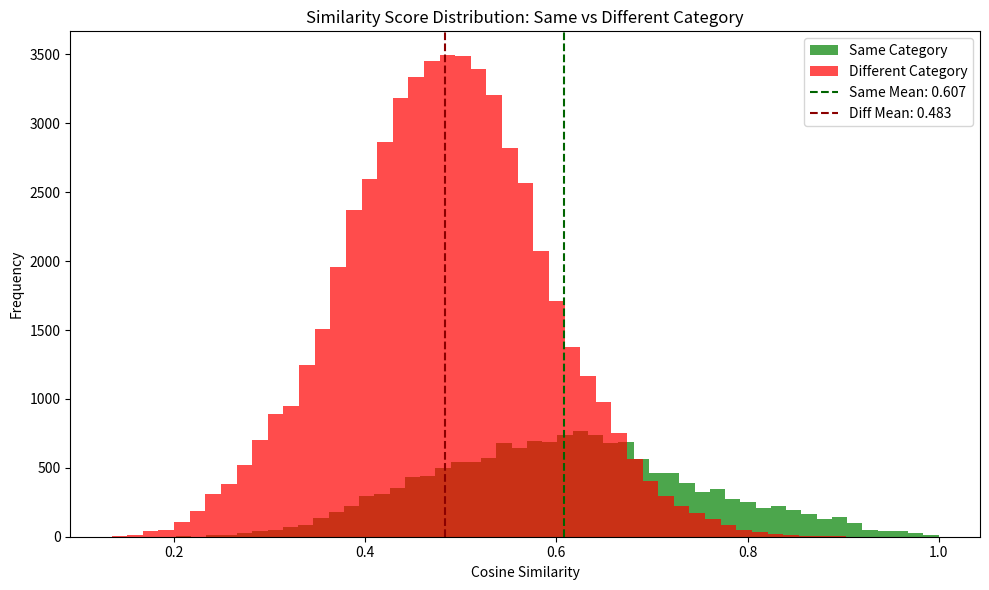

Saved: data/similarity_search_score_distribution.png


In [12]:
# スコア分布のヒストグラム
fig, ax = plt.subplots(figsize=(10, 6))

ax.hist(same_category_scores, bins=50, alpha=0.7, label="Same Category", color="green")
ax.hist(diff_category_scores, bins=50, alpha=0.7, label="Different Category", color="red")

# 平均値を縦線で表示
ax.axvline(same_category_scores.mean(), color="darkgreen", linestyle="--",
           label=f"Same Mean: {same_category_scores.mean():.3f}")
ax.axvline(diff_category_scores.mean(), color="darkred", linestyle="--",
           label=f"Diff Mean: {diff_category_scores.mean():.3f}")

ax.set_xlabel("Cosine Similarity")
ax.set_ylabel("Frequency")
ax.set_title("Similarity Score Distribution: Same vs Different Category")
ax.legend()

plt.tight_layout()
plt.savefig("../data/similarity_search_score_distribution.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: data/similarity_search_score_distribution.png")

## 7. 具体例の可視化

In [13]:
def show_search_results(query_idx, k=10):
    """クエリ画像と検索結果を表示する。"""
    query_category = categories[query_idx]
    query_path = catalog_df.iloc[query_idx]["file_path"]
    
    # 類似度を計算
    query_emb = normalized[query_idx]
    similarities = np.dot(normalized, query_emb)
    similarities[query_idx] = -np.inf  # 自分自身を除外
    
    # Top-k取得
    top_indices = np.argsort(similarities)[::-1][:k]
    
    # 可視化
    fig, axes = plt.subplots(2, 6, figsize=(18, 7))
    
    # クエリ画像
    try:
        query_img = Image.open(query_path)
        axes[0, 0].imshow(query_img)
    except:
        axes[0, 0].text(0.5, 0.5, "Image not found", ha="center", va="center")
    axes[0, 0].set_title(f"QUERY\n{query_category}", fontweight="bold", color="blue")
    axes[0, 0].axis("off")
    
    # 検索結果
    correct_count = 0
    for i, idx in enumerate(top_indices):
        row = (i + 1) // 6
        col = (i + 1) % 6
        
        result_category = categories[idx]
        result_path = catalog_df.iloc[idx]["file_path"]
        score = similarities[idx]
        is_correct = result_category == query_category
        if is_correct:
            correct_count += 1
        
        try:
            result_img = Image.open(result_path)
            axes[row, col].imshow(result_img)
        except:
            axes[row, col].text(0.5, 0.5, "Image not found", ha="center", va="center")
        
        color = "green" if is_correct else "red"
        title = f"#{i+1} ({score:.3f})\n{result_category}"
        axes[row, col].set_title(title, color=color, fontsize=9)
        axes[row, col].axis("off")
    
    # 空のサブプロットを非表示
    for i in range(k + 1, 12):
        row = i // 6
        col = i % 6
        axes[row, col].axis("off")
    
    precision = correct_count / k
    plt.suptitle(f"Query: {query_category} | Precision@{k}: {precision:.2f} ({correct_count}/{k} correct)",
                 fontsize=14, fontweight="bold")
    plt.tight_layout()
    return precision

Sample Search Results by Category


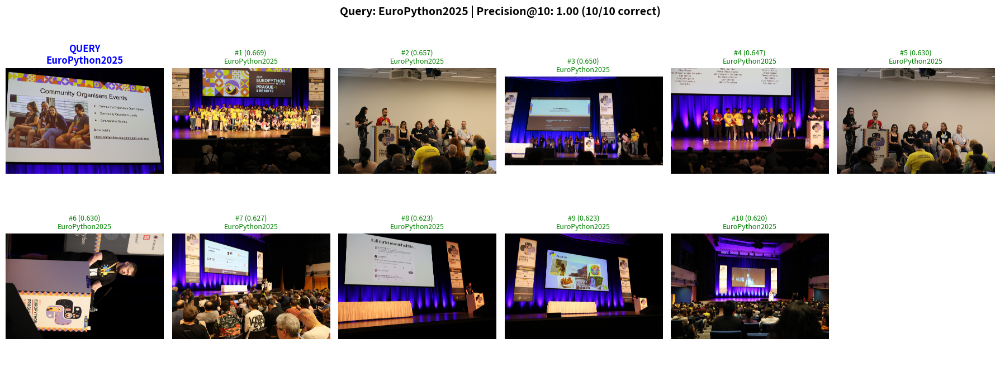


EuroPython2025: Precision@10 = 1.00



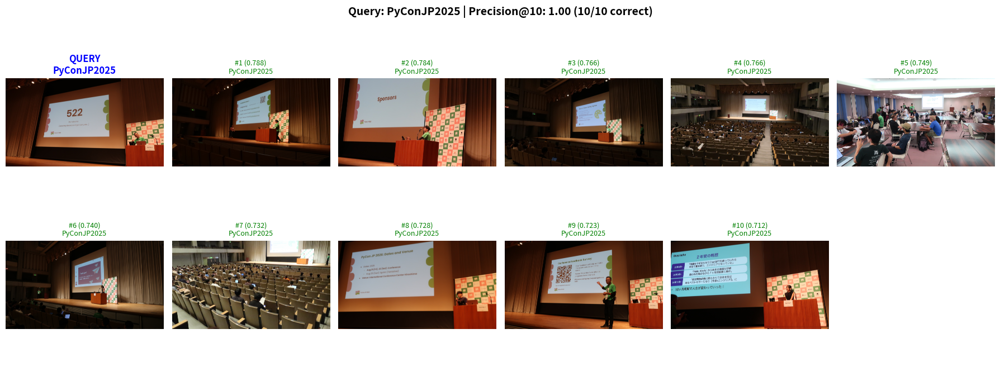


PyConJP2025: Precision@10 = 1.00



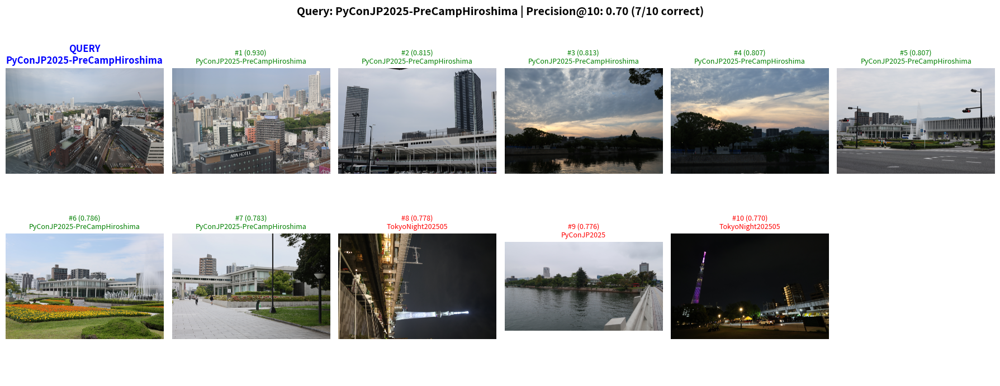


PyConJP2025-PreCampHiroshima: Precision@10 = 0.70



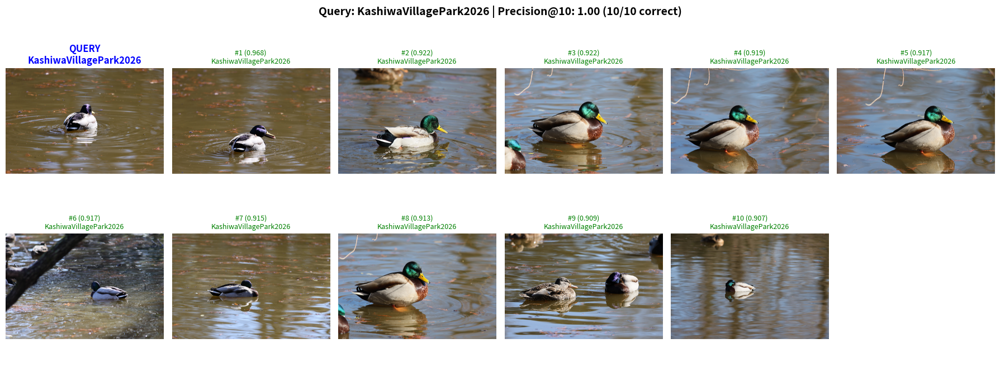


KashiwaVillagePark2026: Precision@10 = 1.00



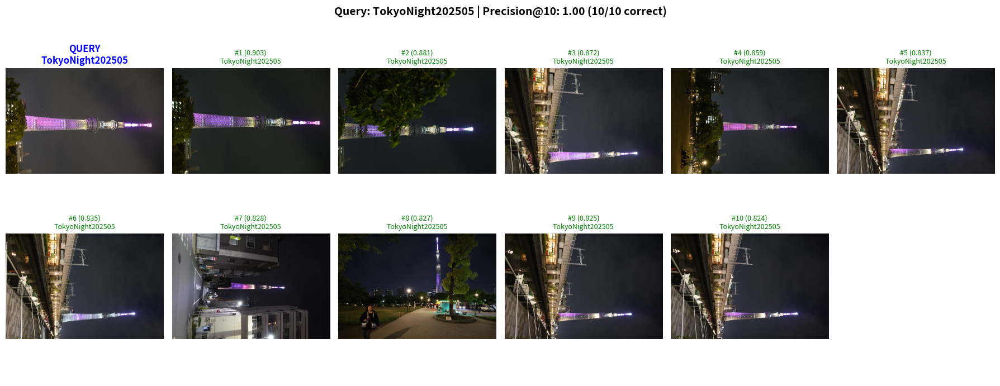


TokyoNight202505: Precision@10 = 1.00



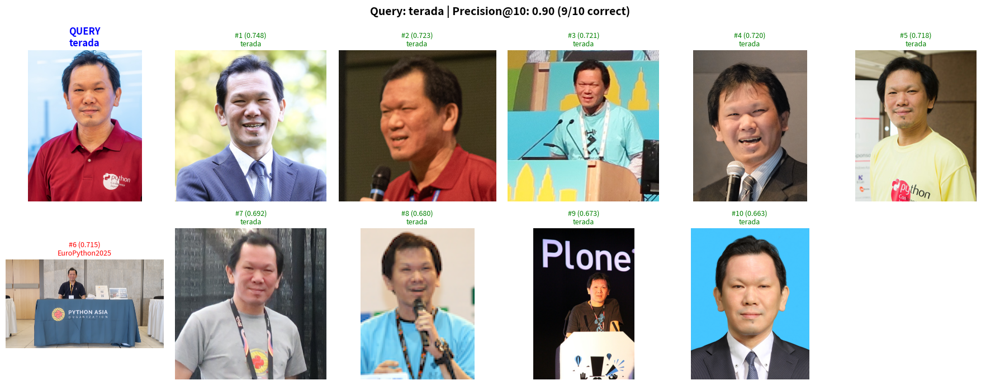


terada: Precision@10 = 0.90



In [14]:
# 各カテゴリから代表的なクエリを1つ選んで可視化
print("=" * 60)
print("Sample Search Results by Category")
print("=" * 60)

for cat in category_names:
    # このカテゴリの最初の画像をクエリとして使用
    cat_indices = [i for i, c in enumerate(categories) if c == cat]
    if cat_indices:
        query_idx = cat_indices[0]
        precision = show_search_results(query_idx, k=10)
        plt.show()
        print(f"\n{cat}: Precision@10 = {precision:.2f}\n")

## 8. 成功・失敗ケースの分析

In [15]:
# 各クエリのPrecision@10を計算
query_precisions = []

for i in range(len(embeddings)):
    query_emb = normalized[i]
    similarities = np.dot(normalized, query_emb)
    similarities[i] = -np.inf
    
    top_indices = np.argsort(similarities)[::-1][:10]
    top_categories = [categories[idx] for idx in top_indices]
    
    correct = sum(1 for c in top_categories if c == categories[i])
    precision = correct / 10
    query_precisions.append({
        "idx": i,
        "category": categories[i],
        "precision_at_10": precision,
        "file_path": catalog_df.iloc[i]["file_path"],
    })

precision_df = pd.DataFrame(query_precisions)

print("Precision@10 Distribution:")
print(precision_df["precision_at_10"].describe())

Precision@10 Distribution:
count    378.000000
mean       0.840476
std        0.228539
min        0.100000
25%        0.700000
50%        1.000000
75%        1.000000
max        1.000000
Name: precision_at_10, dtype: float64


In [16]:
# 成功ケース（P@10 >= 0.8）
success_cases = precision_df[precision_df["precision_at_10"] >= 0.8]
print(f"\nSuccess cases (P@10 >= 0.8): {len(success_cases)} / {len(precision_df)}")
print(success_cases["category"].value_counts())


Success cases (P@10 >= 0.8): 278 / 378
category
EuroPython2025                  102
PyConJP2025                      58
KashiwaVillagePark2026           52
TokyoNight202505                 41
PyConJP2025-PreCampHiroshima     16
terada                            9
Name: count, dtype: int64


In [17]:
# 失敗ケース（P@10 < 0.5）
failure_cases = precision_df[precision_df["precision_at_10"] < 0.5]
print(f"\nFailure cases (P@10 < 0.5): {len(failure_cases)} / {len(precision_df)}")
print(failure_cases["category"].value_counts())


Failure cases (P@10 < 0.5): 32 / 378
category
PyConJP2025                     13
EuroPython2025                   8
PyConJP2025-PreCampHiroshima     7
TokyoNight202505                 3
KashiwaVillagePark2026           1
Name: count, dtype: int64



Worst case: PyConJP2025 (P@10 = 0.10)


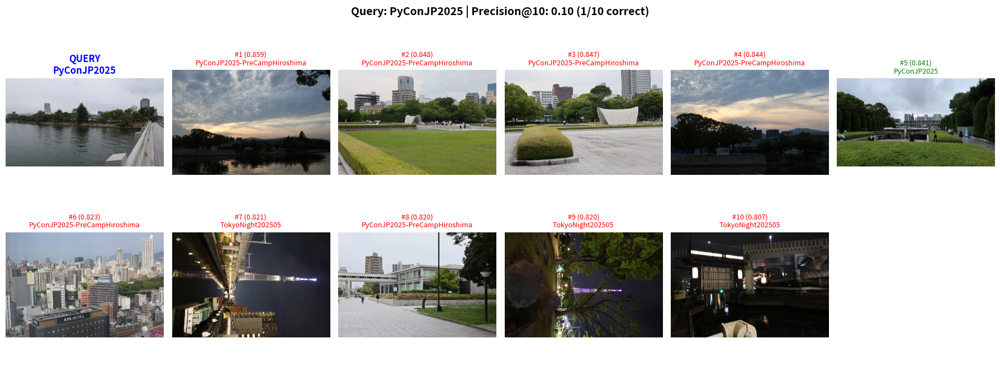

In [18]:
# 失敗ケースを可視化（最も悪いケースを表示）
if len(failure_cases) > 0:
    worst_case = failure_cases.sort_values("precision_at_10").iloc[0]
    print(f"\nWorst case: {worst_case['category']} (P@10 = {worst_case['precision_at_10']:.2f})")
    show_search_results(worst_case["idx"], k=10)
    plt.savefig("../data/similarity_search_failure_case.png", dpi=150, bbox_inches="tight")
    plt.show()
else:
    print("No failure cases found!")


Best case: EuroPython2025 (P@10 = 1.00)


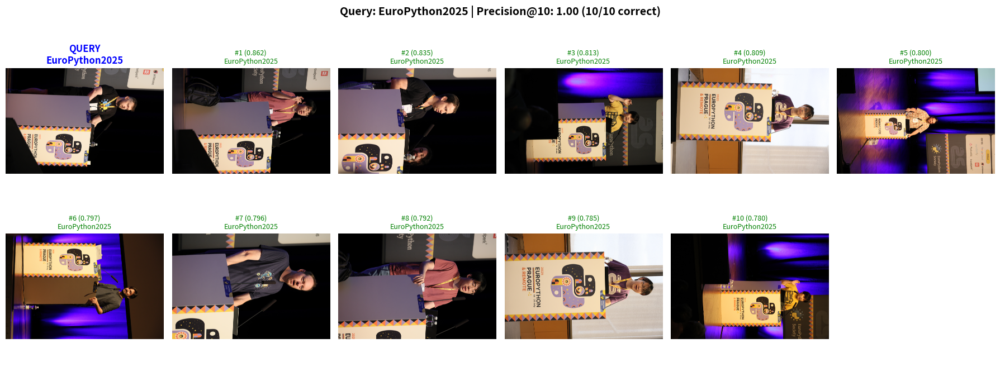

In [19]:
# 成功ケースを可視化（最も良いケースを表示）
if len(success_cases) > 0:
    best_case = success_cases.sort_values("precision_at_10", ascending=False).iloc[0]
    print(f"\nBest case: {best_case['category']} (P@10 = {best_case['precision_at_10']:.2f})")
    show_search_results(best_case["idx"], k=10)
    plt.savefig("../data/similarity_search_success_case.png", dpi=150, bbox_inches="tight")
    plt.show()

## 9. 結果の保存

In [20]:
# 結果をJSONとして保存
output_path = OUTPUT_DIR / f"similarity_search_{MODEL_NAME.replace('/', '_')}_{metrics.timestamp[:10]}.json"

with open(output_path, "w") as f:
    json.dump(metrics.to_dict(), f, indent=2)

print(f"Results saved to: {output_path}")

Results saved to: ../data/evaluations/similarity_search_openai_clip-vit-large-patch14_2026-02-03.json


## 10. 評価とまとめ

## 評価と考察

### 1. 全体的な性能評価

CLIP-L (openai/clip-vit-large-patch14) による類似画像検索は**非常に高い性能**を示した。

| 指標 | 値 | 解釈 |
|------|-----|------|
| Precision@1 | **94.4%** | 最も類似した画像が同じカテゴリである確率が非常に高い |
| Precision@10 | **84.1%** | 上位10件中、約8.4件が同じカテゴリ |
| Hit Rate@10 | **100%** | 上位10件には必ず正解が含まれる |
| MRR | **0.963** | ほぼ1位で正解が見つかる |
| MAP | **0.890** | ランキング全体の品質も高い |

### 2. カテゴリ別の性能分析

カテゴリによって若干の性能差が観察された：

| カテゴリ | P@1 | P@10 | 件数 | 特徴 |
|----------|-----|------|------|------|
| terada | 100% | 86.0% | 10 | 人物写真、特徴的で識別しやすい |
| TokyoNight202505 | 100% | 89.2% | 49 | 夜景、視覚的に統一感がある |
| KashiwaVillagePark2026 | 98.2% | 96.4% | 56 | 自然風景、視覚的に特徴的 |
| EuroPython2025 | 94.6% | 87.2% | 129 | カンファレンス写真 |
| PyConJP2025 | 90.9% | 79.9% | 77 | カンファレンス写真 |
| PyConJP2025-PreCampHiroshima | 89.5% | 65.6% | 57 | イベント写真、やや多様な内容 |

### 3. 類似度スコア分布

埋め込みベクトルの類似度分布を分析した結果：

| ペアタイプ | 平均類似度 | 標準偏差 |
|-----------|-----------|---------|
| 同一カテゴリ | 0.608 | 0.137 |
| 異なるカテゴリ | 0.483 | 0.105 |

- **同一カテゴリ内の類似度が高い**: 同じカテゴリの画像は埋め込み空間で近くに配置
- **類似度の分離**: 同一カテゴリと異カテゴリの分布が明確に分離している

### 4. 成功・失敗ケースの分析

| ケース | 件数 | 割合 |
|--------|------|------|
| 成功 (P@10 ≥ 0.8) | 278 | 73.5% |
| 失敗 (P@10 < 0.5) | 32 | 8.5% |

- 失敗ケースは主に「PyConJP2025」「PyConJP2025-PreCampHiroshima」で発生
- これらのカテゴリは視覚的に多様な内容（スライド、会場、人物など）を含むため

### 5. CLIPの特性

CLIP-Lは視覚的・意味的類似性を効果的に捉えている：

- **成功要因**: 視覚的に統一感のあるカテゴリ（夜景、公園、人物）では高精度
- **課題**: イベント写真など視覚的に多様なカテゴリではやや性能低下
- **全体的に優秀**: MRR 0.963は、ほぼ1位で正解を返すことを意味する

### 6. 結論

> **CLIP-Lによる類似画像検索は、カテゴリベースの評価において非常に高い性能を示した。**

- **P@1 = 94.4%**: 検索結果の1位がほぼ正解
- **MRR = 0.963**: ランキング品質も優秀
- **Hit Rate@10 = 100%**: 上位10件には必ず正解が含まれる

視覚的に統一感のあるカテゴリでは特に高い性能を発揮し、実用的な類似画像検索システムとして十分な性能を持つ。